# 2 Simplest fractal: Mandelbrot Set

Q1) See below

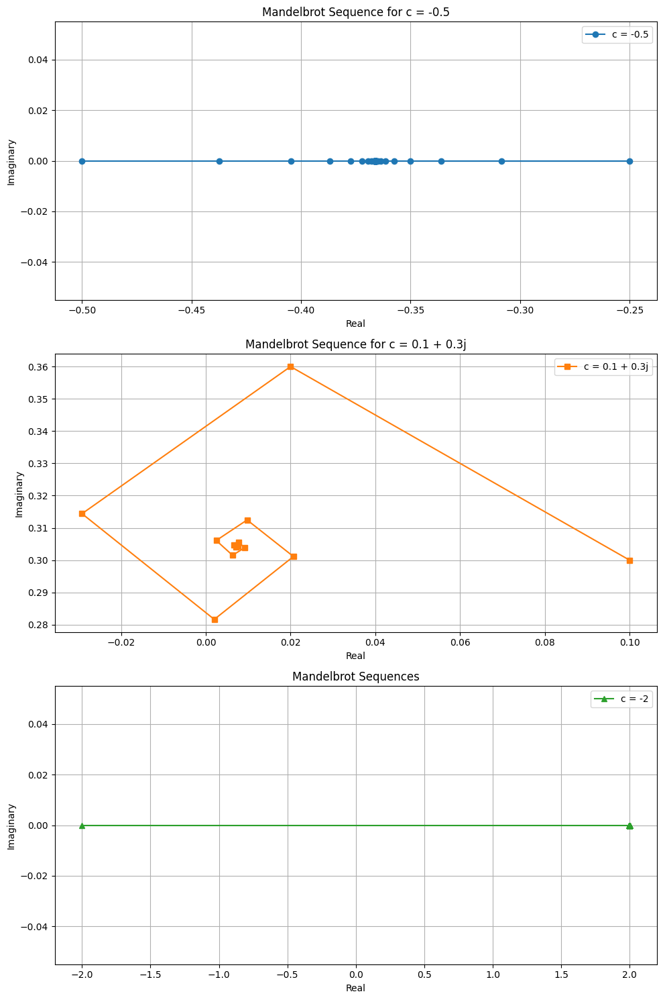

In [7]:
from src.mandelbrot import MandelBrot
import matplotlib.pyplot as plt

# Plot the real and imaginary parts of the complex sequences

vals1 = MandelBrot(-0.5, 1000, False)
vals2 = MandelBrot(0.1 + 0.3j, 1000, False)
vals3 = MandelBrot(-2, 1000, False)

fig, axs = plt.subplots(3, 1, figsize=(10, 15))
axs[0].plot([z.real for z in vals1], [z.imag for z in vals1], marker='o', color='tab:blue', label='c = -0.5')
axs[0].set_title('Mandelbrot Sequence for c = -0.5')
axs[0].set_xlabel('Real')
axs[0].set_ylabel('Imaginary')
axs[0].grid(True)
axs[0].legend()

axs[1].plot([z.real for z in vals2], [z.imag for z in vals2], marker='s', color='tab:orange', label='c = 0.1 + 0.3j')
axs[1].set_title('Mandelbrot Sequence for c = 0.1 + 0.3j')
axs[1].set_xlabel('Real')
axs[1].set_ylabel('Imaginary')
axs[1].grid(True)
axs[1].legend()

axs[2].plot([z.real for z in vals3], [z.imag for z in vals3], marker='^', color='tab:green', label='c = -2')
axs[2].set_title('Mandelbrot Sequence for c = -2')
axs[2].set_xlabel('Real')
axs[2].set_ylabel('Imaginary')
axs[2].grid(True)
axs[2].legend()

plt.title('Mandelbrot Sequences')
plt.xlabel('Real')
plt.ylabel('Imaginary')
plt.grid(True)
plt.legend()


plt.tight_layout()
plt.savefig('plots/questions/mandelbrot_sequences.pdf')
plt.show()

# Keep vals1, vals2, vals3 unchanged


Q2) we use these values
- 0
- -0.5
- 0.25
- -1
- 0.3 + 0.5j
- -0.7 + 0.2j
- -0.8 + 0.156j
- -0.4 + 0.6j
- 0.32 - 0.043j

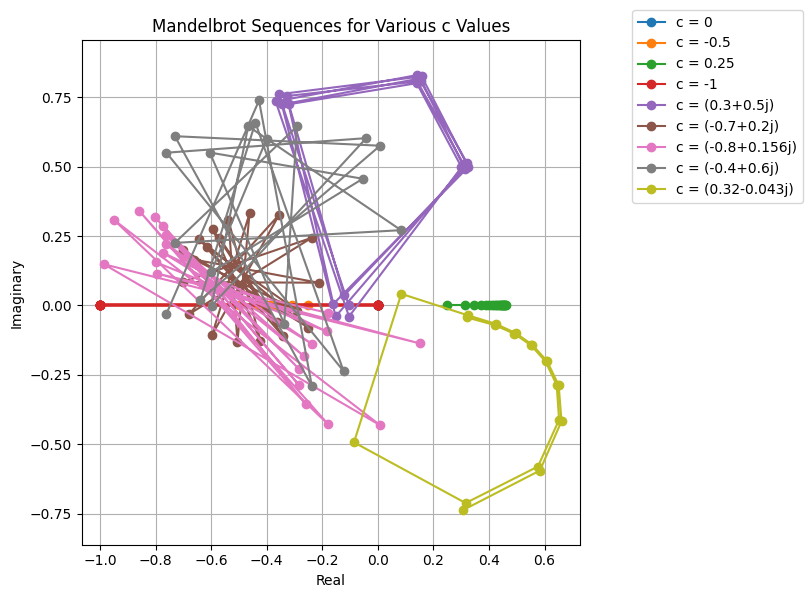

In [27]:
from src.mandelbrot import MandelBrot
import matplotlib.pyplot as plt
c_values = [
    0,
    -0.5,
    0.25,
    -1,
    0.3 + 0.5j,
    -0.7 + 0.2j,
    -0.8 + 0.156j,
    -0.4 + 0.6j,
    0.32 - 0.043j
]

fig = plt.figure(figsize=(6, 6))
for c in c_values:
    vals = MandelBrot(c, 20)
    plt.plot([z.real for z in vals], [z.imag for z in vals], marker='o', label=f'c = {c}')
plt.title('Mandelbrot Sequences for Various c Values')
plt.xlabel('Real')
plt.ylabel('Imaginary')
plt.grid(True)
fig.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.axis('equal')
plt.tight_layout()  # Add space for the legend
plt.savefig('plots/questions/more_mandelbrot_sequences.pdf', bbox_inches='tight')
plt.show()
    

Q3) Already included
Q4)

Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.


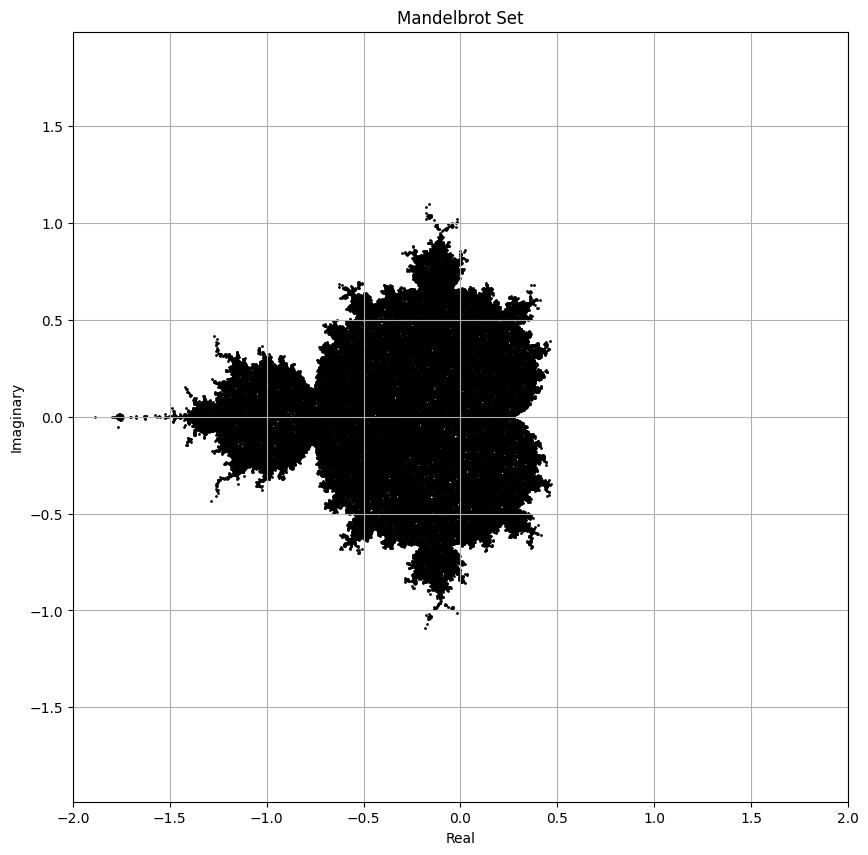

In [28]:
import numpy as np

N = 200000

c_values = np.random.uniform(-2, 0.5, size=(N)) + \
            1j * np.random.uniform(-1.1, 1.1, size=(N))

vals = [MandelBrot(c, 20, True) for c in c_values]

mb_set = [mb.c for mb in vals if len([z for z in mb]) == 20]
zz = np.array(mb_set)
plt.figure(figsize=(10, 10))
plt.scatter(zz.real, zz.imag, s=1, color='black')
plt.title('Mandelbrot Set')
plt.axis('equal')
plt.xlim(-2, 2)
plt.ylim(-2, 2)
plt.xlabel('Real')
plt.ylabel('Imaginary')
plt.grid(True)
plt.savefig('plots/questions/mandelbrot_set.png')





(231496,)


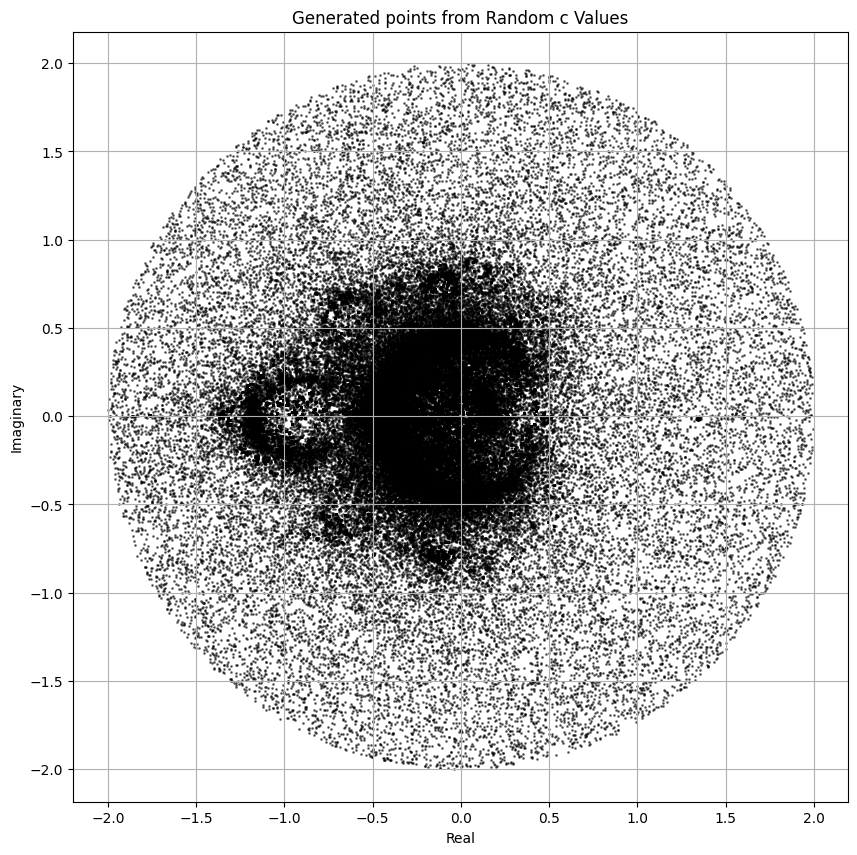

In [29]:
# Plot of points for fun
N = 20000
c_values = np.random.uniform(-2, 2, size=(N)) + \
            1j * np.random.uniform(-2, 2, size=(N))
vals = [MandelBrot(c, 100, True) for c in c_values]
points = np.array([z for sublist in vals for z in sublist])
print(points.shape)
plt.figure(figsize=(10, 10))
plt.scatter(points.real, points.imag, s=1, color='black', alpha=0.5)
plt.title('Generated points from Random c Values')
plt.xlabel('Real')
plt.ylabel('Imaginary')
plt.grid(True)
plt.axis('equal')
plt.savefig('plots/mandelbrot_points.png')
plt.show()

# 3 Sierpinsky Triangle
Q5) See the code block below.

Iteration 1: Added 3 points, Total points: 6
Iteration 2: Added 9 points, Total points: 15
Iteration 3: Added 27 points, Total points: 42
Iteration 4: Added 81 points, Total points: 123
Iteration 5: Added 243 points, Total points: 366
Iteration 6: Added 729 points, Total points: 1095
Iteration 7: Added 2187 points, Total points: 3282


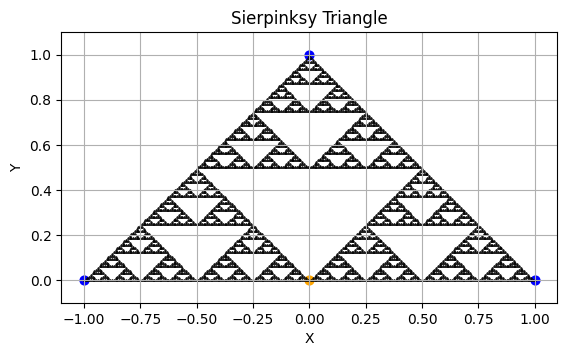

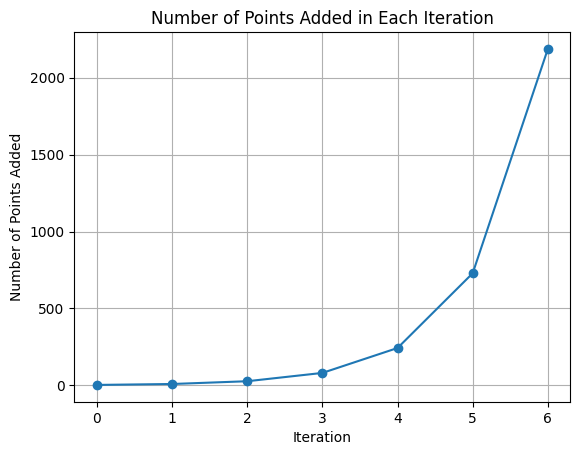

In [11]:
from src.sierpinsky import SierpinskyTriangle, Point
import matplotlib.pyplot as plt

triangle = SierpinskyTriangle([Point(-1,0), Point(1, 0), Point(0, 1)])
points_added = []

N = 7

for i in range(N):
    triangle.generate_triangle()
    points_added.append(len(triangle.last_new))
    print(f"Iteration {i+1}: Added {len(triangle.last_new)} points, Total points: {len(triangle.points)}")
    

fig = triangle.plot("Sierpinksy Triangle")
fig.savefig('plots/questions/triangle.pdf')
plt.show()


plt.plot(range(N), points_added, marker='o', linestyle='-', color='tab:blue')
plt.title('Number of Points Added in Each Iteration')
plt.xlabel('Iteration')
plt.ylabel('Number of Points Added')
plt.xticks(range(N))
plt.grid(True)
plt.savefig('plots/questions/num_points.pdf')
plt.show()


Q7)

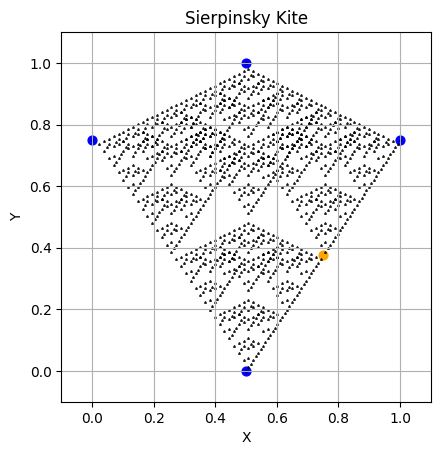

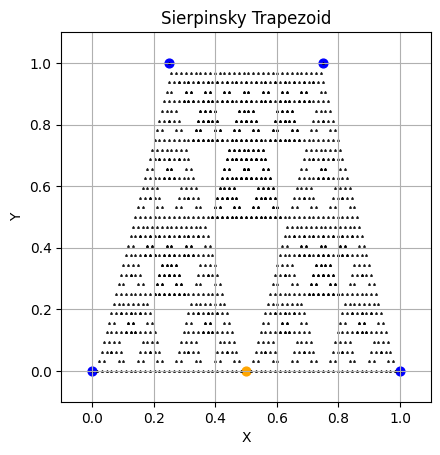

In [12]:
from src.sierpinsky import SierpinskyTriangle, Point
import matplotlib.pyplot as plt

kite = SierpinskyTriangle([Point(0, 0.75), Point(0.5, 0), Point(1, 0.75), Point(0.5, 1)])
trapezium = SierpinskyTriangle([Point(0, 0), Point(1, 0), Point(0.25, 1), Point(0.75, 1)])

N = 5

for i in range(N):
    trapezium.generate_triangle()
    kite.generate_triangle()

fig = kite.plot("Sierpinsky Kite")
fig.savefig("plots/questions/kite.pdf")
plt.show()

fig = trapezium.plot("Sierpinsky Trapezoid")
fig.savefig("plots/questions/trapezoid.pdf")
plt.show()



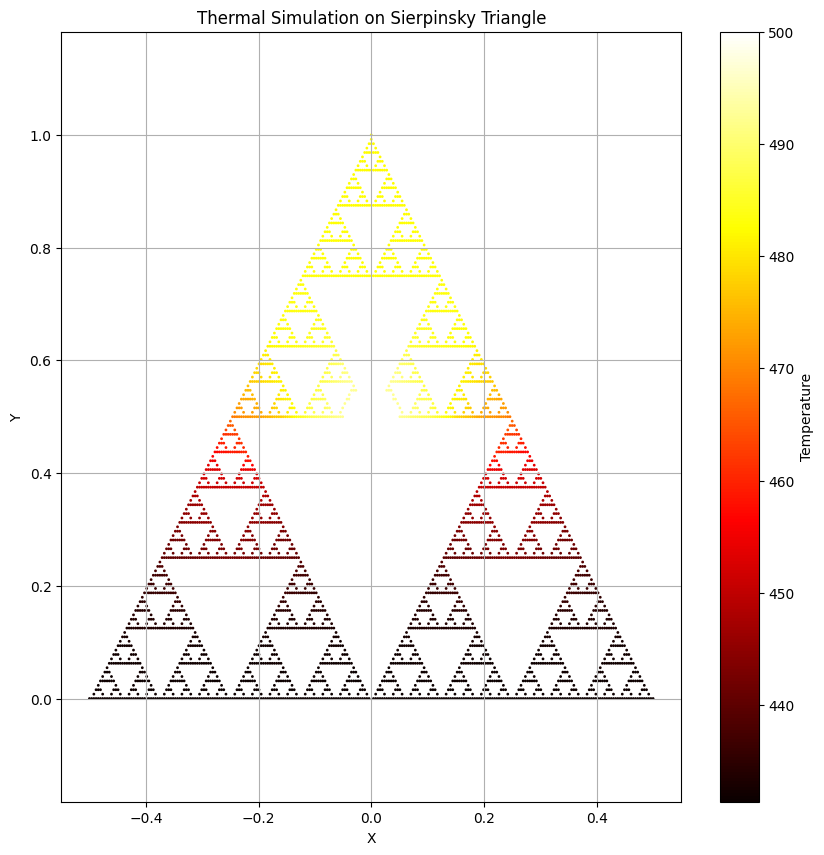

In [13]:
from src.heatequation import ThermalSimulation
from src.sierpinsky import SierpinskyTriangle, Point
import matplotlib.pyplot as plt

triangle = SierpinskyTriangle([Point(-0.5,0), Point(0.5, 0), Point(0, 1)])
for _ in range(7):
    triangle.generate_triangle()
sim = ThermalSimulation(triangle.points, 0.1)
sim.place_source(Point(0, 0.5), 500, 0.05)

sim.simulate(5000, 5, save_series=False)
plt.figure(figsize=(10, 10))
plt.scatter([p.x for p in triangle.points], [p.y for p in triangle.points], c=sim.temperature, cmap='hot', s=1)
plt.colorbar(label='Temperature')
plt.title('Thermal Simulation on Sierpinsky Triangle')
plt.xlabel('X')
plt.ylabel('Y')
plt.xlim(-0.1, 1.1)
plt.ylim(-0.1, 1.1)
plt.grid(True)
plt.axis('equal')
plt.savefig('plots/questions/heat_triangle.pdf')
plt.show()

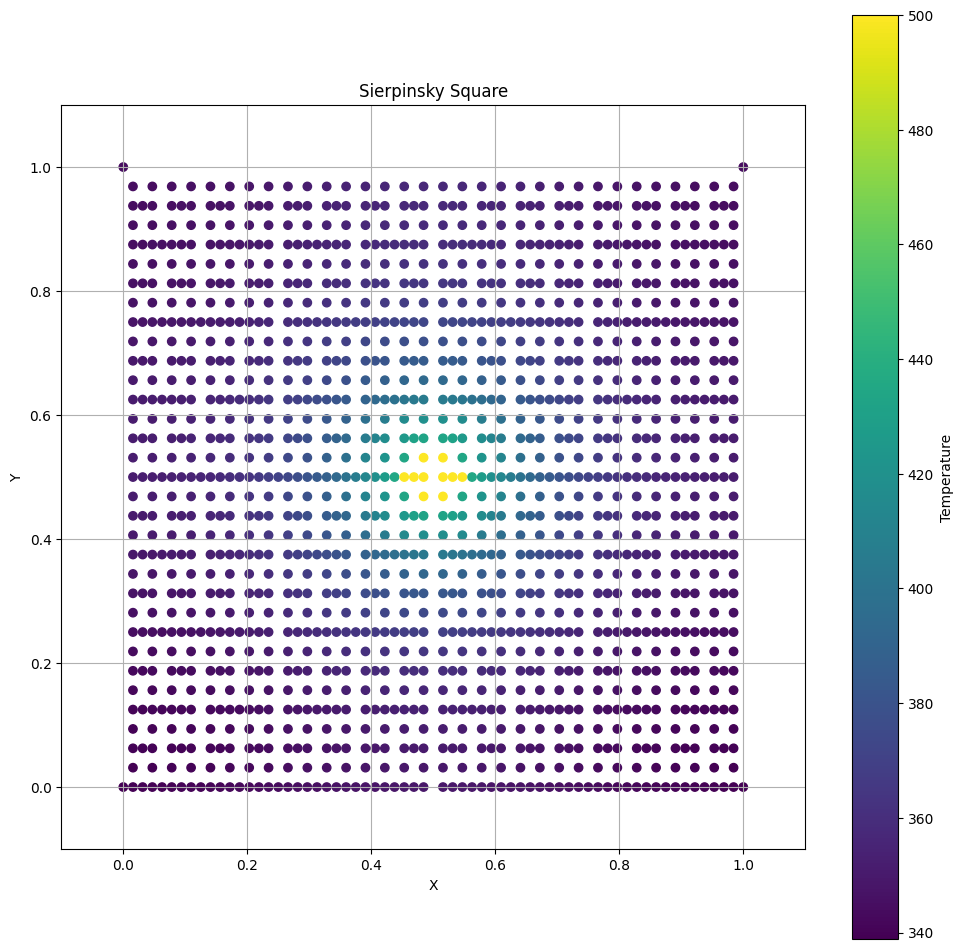

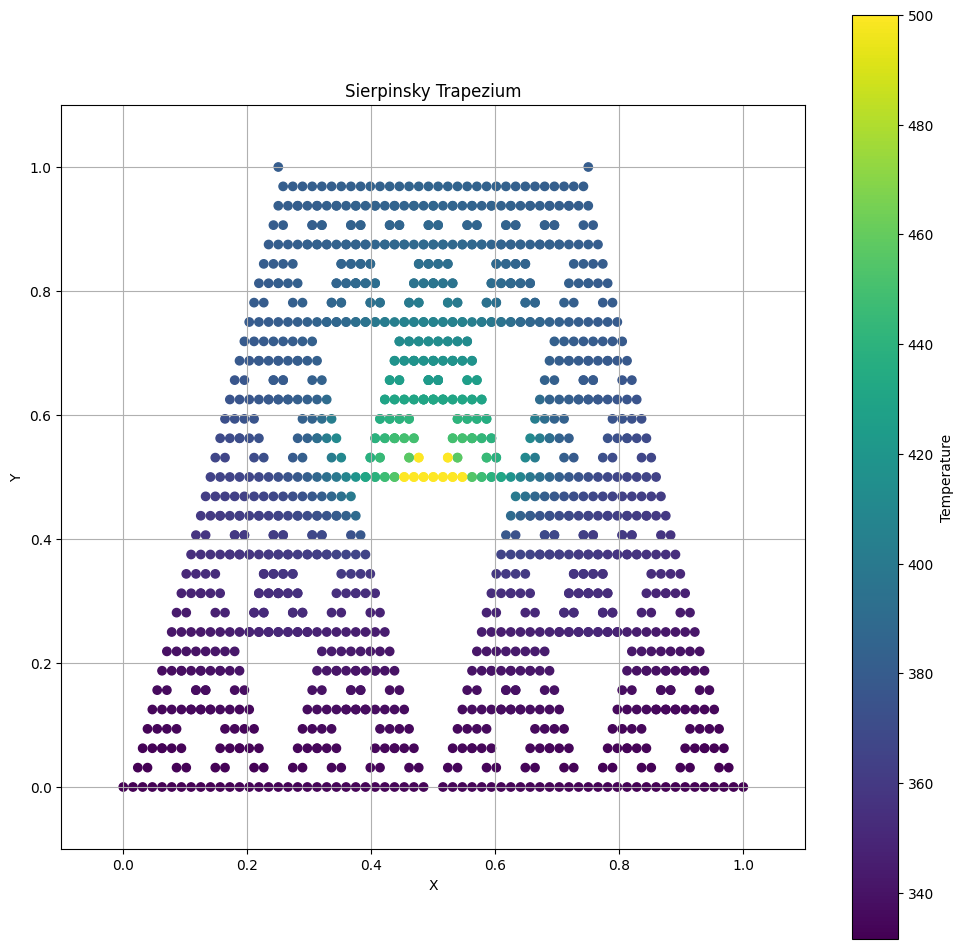

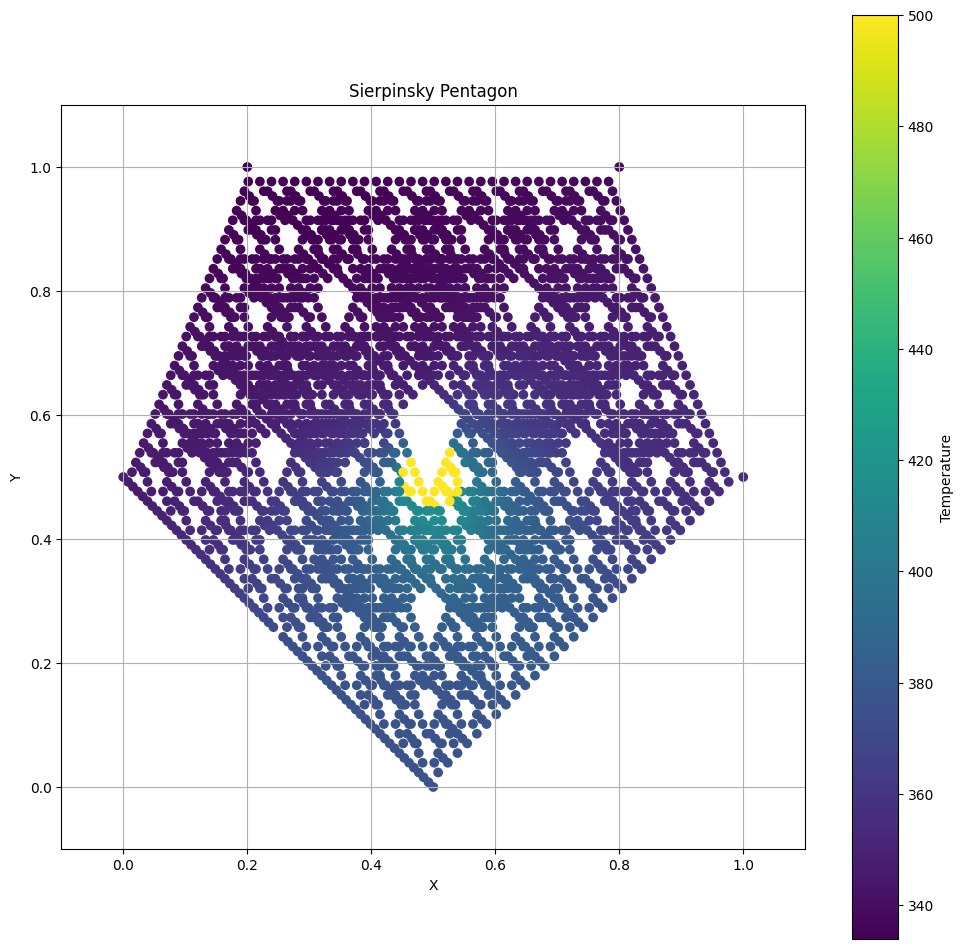

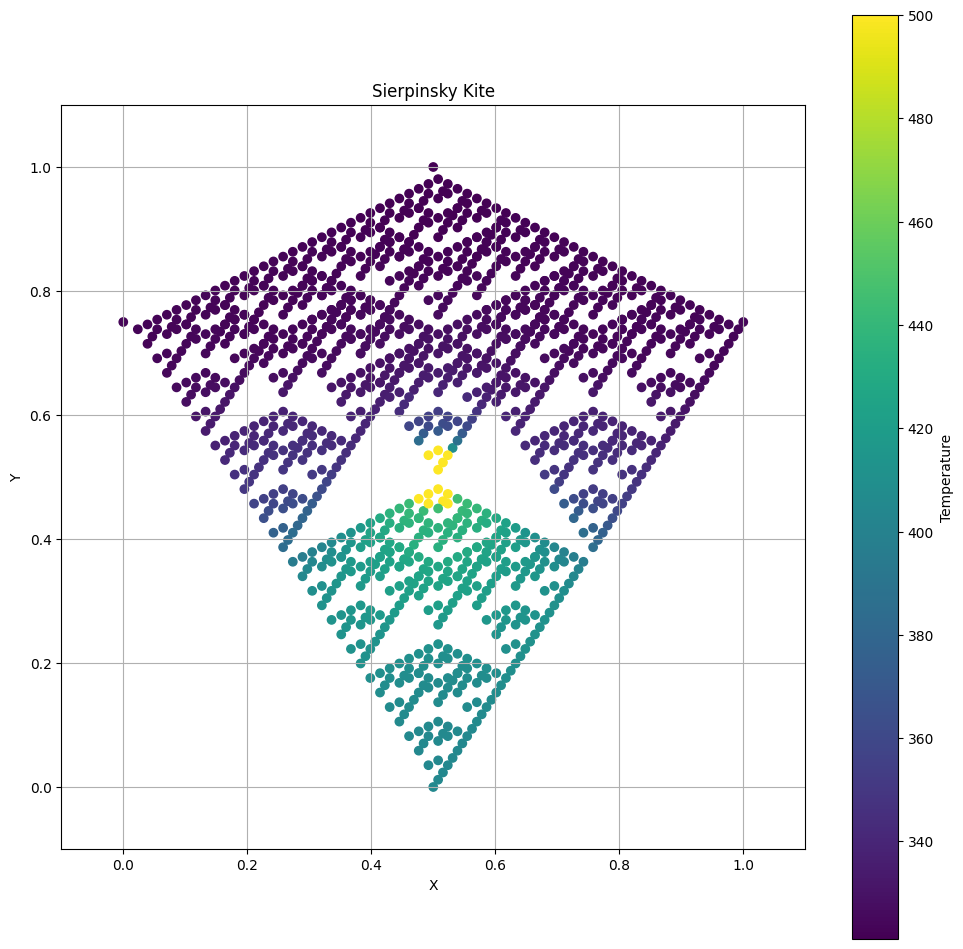

In [14]:
# Some other shapes:
square = SierpinskyTriangle([Point(0,0), Point(1,0), Point(0,1), Point(1,1)])
pentagon = SierpinskyTriangle([Point(0.5, 0), Point(1, 0.5), Point(0.8, 1), Point(0.2, 1), Point(0, 0.5)])
kite = SierpinskyTriangle([Point(0, 0.75), Point(0.5, 0), Point(1, 0.75), Point(0.5, 1)])
trapezium = SierpinskyTriangle([Point(0, 0), Point(1, 0), Point(0.25, 1), Point(0.75, 1)])
N = 5

for i in range(N):
    square.generate_triangle()
    kite.generate_triangle()
    pentagon.generate_triangle()
    trapezium.generate_triangle()

shapes = [square, trapezium, pentagon, kite]
titles = ['Sierpinsky Square', 'Sierpinsky Trapezium', 'Sierpinsky Pentagon', 'Sierpinsky Kite']

for shape, title in zip(shapes, titles):
    X_shape = [p.x for p in shape.points]
    Y_shape = [p.y for p in shape.points]
    
    sim = ThermalSimulation(shape.points, alpha=0.1)
    sim.place_source(Point(0.5, 0.5), 500, 0.05)
    sim.simulate(1000, 5)
    
    plt.figure(figsize=(12, 12))
    scatter = plt.scatter(X_shape, Y_shape, c=sim.temperature)
    plt.title(title)
    plt.xlabel('X')
    plt.ylabel('Y')
    plt.xlim(min(X_shape) - 0.1, max(X_shape) + 0.1)
    plt.ylim(min(Y_shape) - 0.1, max(Y_shape) + 0.1)
    plt.grid(True)
    plt.gca().set_aspect('equal')
    plt.colorbar(scatter, label='Temperature')
    plt.savefig(f'plots/quadrilaterals/heat_{title.lower().replace(" ", "_")}.pdf')
    plt.show()


In [15]:
triangle = SierpinskyTriangle([Point(-0.5,0), Point(0.5, 0), Point(0, 1)])
for _ in range(7):
    triangle.generate_triangle()
sim = ThermalSimulation(triangle.points, 0.1)
sim.place_source(Point(0, 0.5), 500, 0.05)
dt = 5
t_max = 5000
temps = sim.simulate(t_max, dt, True)

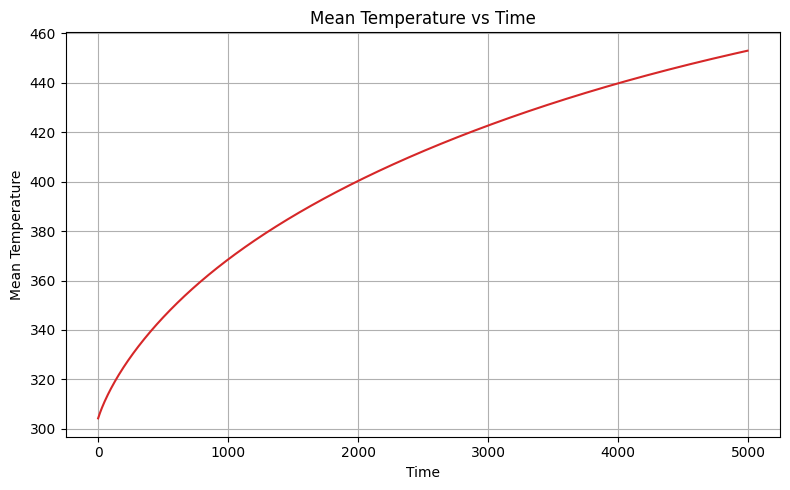

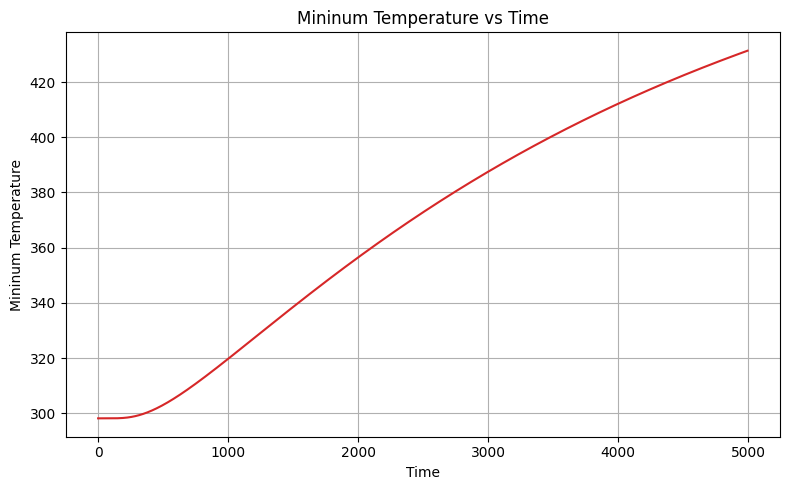

In [ ]:
import numpy as np
from src.heatequation import UREF
import matplotlib.pyplot as plt

mean_temps = np.mean(temps, axis=1)
plt.figure(figsize=(8, 5))
plt.plot(np.arange(len(mean_temps)) * dt, mean_temps, color='tab:red')
plt.xlabel('Time')
plt.ylabel('Mean Temperature')
plt.title('Mean Temperature vs Time')
plt.grid(True)
plt.tight_layout()
plt.savefig("plots/questions/meantemp.pdf")
plt.show()

min_temps = np.min(temps, axis=1)
plt.figure(figsize=(8, 5))
plt.plot(np.arange(len(min_temps)) * dt, min_temps, color='tab:red')
plt.xlabel('Time')
plt.ylabel('Mininum Temperature')
plt.title('Mininum Temperature vs Time')
plt.grid(True)
plt.tight_layout()
plt.savefig("plots/questions/minntemp.pdf")
plt.show()

In [17]:
from matplotlib import animation
from IPython.display import HTML

step = 20
frames = range(0, len(temps), step)

fig, ax = plt.subplots(figsize=(8, 8))
sc = ax.scatter([p.x for p in triangle.points], [p.y for p in triangle.points], c=temps[0], cmap='hot', s=1)
plt.colorbar(sc, ax=ax, label='Temperature')
ax.set_title('Thermal Simulation on Sierpinsky Triangle (Animated)')
ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_xlim(-0.6, 0.6)
ax.set_ylim(-0.1, 1.1)
ax.grid(True)
ax.set_aspect('equal')

def animate(i):
    sc.set_array(temps[frames[i]])
    ax.set_title(f'Thermal Simulation (Step {frames[i]*dt}/{t_max})')
    return sc,

ani = animation.FuncAnimation(fig, animate, frames=len(frames), interval=200, blit=True)

ani.save('plots/thermal_simulation_animation.gif', writer='pillow', fps=5)
plt.close(fig)
HTML(ani.to_jshtml())

### Open Section
## Core

5464


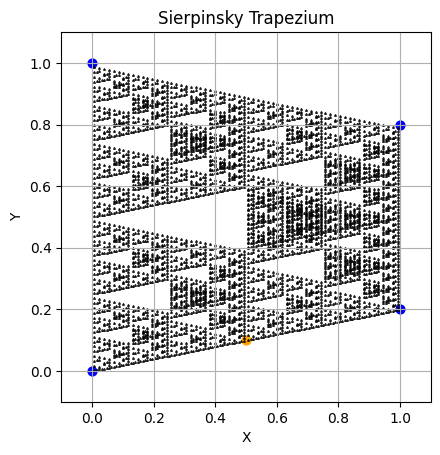

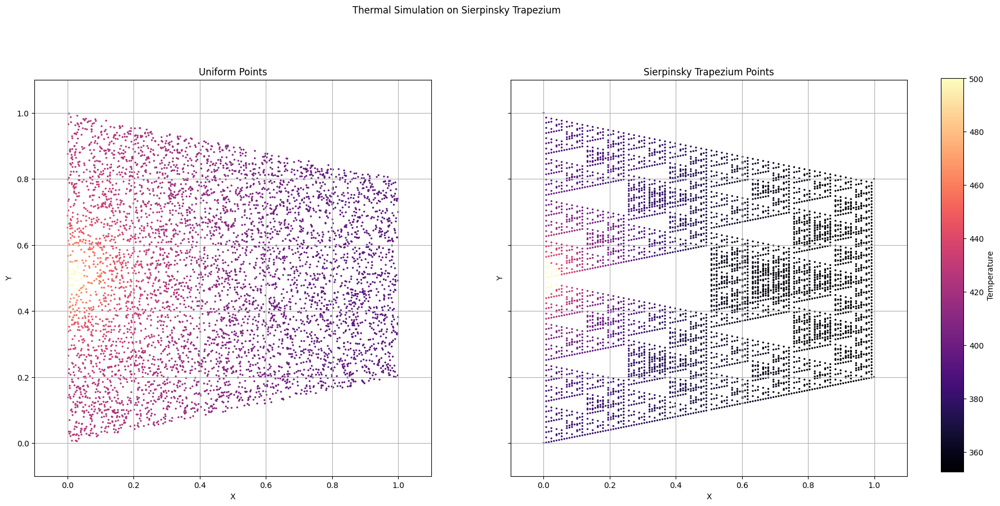

In [1]:
from src.sierpinsky import SierpinskyTriangle, Point
from src.heatequation import ThermalSimulation
from random import uniform
import matplotlib.pyplot as plt

ALPHA = 0.1
dt = 5
t_max = 5000

trap = SierpinskyTriangle([Point(0,0), Point(1,0.2), Point(0,1), Point(1,0.8)])
for _ in range(6):
    trap.generate_triangle()
fig = trap.plot("Sierpinsky Trapezium")
fig.savefig('plots/opensec/trap.pdf')
print(len(trap.points))

sim_trap = ThermalSimulation(trap.points, ALPHA)
sim_trap.place_source(Point(0, 0.5), 500, 0.05)
temps_trap = sim_trap.simulate(5000, 5, save_series=True)



# Uniform points
num_points = len(trap.points)
bbox_x = [p.x for p in trap.corners]
bbox_y = [p.y for p in trap.corners]
min_x, max_x = min(bbox_x), max(bbox_x)
min_y, max_y = min(bbox_y), max(bbox_y)

uniform_points = []
while len(uniform_points) < num_points:
    x = uniform(min_x, max_x)
    y = uniform(min_y, max_y)
    pt = Point(x, y)
    if pt.is_inside_polygon(trap.corners):
        uniform_points.append(pt)
sim_uni = ThermalSimulation(uniform_points, ALPHA)
sim_uni.place_source(Point(0, 0.5), 500, 0.05)
temps_uni = sim_uni.simulate(5000, 5, save_series=True)


fig, axs = plt.subplots(1, 2, figsize=(20, 10), sharex=True, sharey=True)

sc1 = axs[0].scatter([p.x for p in uniform_points],
                     [p.y for p in uniform_points], c=sim_uni.temperature, cmap='magma', s=2)
axs[0].set_title('Uniform Points')
axs[0].set_xlabel('X')
axs[0].set_ylabel('Y')
axs[0].grid(True)
axs[0].set_xlim(-0.1, 1.1)
axs[0].set_ylim(-0.1, 1.1)
axs[0].set_aspect('equal')

sc2 = axs[1].scatter([p.x for p in trap.points],
                     [p.y for p in trap.points], c=sim_trap.temperature, cmap='magma', s=2)
axs[1].set_title('Sierpinsky Trapezium Points')
axs[1].set_xlabel('X')
axs[1].set_ylabel('Y')
axs[1].grid(True)
axs[1].set_xlim(-0.1, 1.1)
axs[1].set_ylim(-0.1, 1.1)
axs[1].set_aspect('equal')

# colour bar
vmin = min(sim_uni.temperature.min(), sim_trap.temperature.min())
vmax = max(sim_uni.temperature.max(), sim_trap.temperature.max())
sc1.set_clim(vmin, vmax)
sc2.set_clim(vmin, vmax)
cbar_ax = fig.add_axes([0.93, 0.15, 0.02, 0.7]) 
cbar = fig.colorbar(sc1, cax=cbar_ax)
cbar.set_label('Temperature')

plt.suptitle('Thermal Simulation on Sierpinsky Trapezium')
plt.savefig('plots/opensec/heat_trapezium_combined.pdf', bbox_inches='tight')
plt.show()


In [2]:
from matplotlib import animation
from IPython.display import HTML

step = 200
frames = range(0, len(temps_trap), step)

fig, axs = plt.subplots(1, 2, figsize=(20, 10), sharex=True, sharey=True)

sc1 = axs[0].scatter([p.x for p in uniform_points],
                     [p.y for p in uniform_points], c=temps_uni[0], cmap='magma', s=2)
axs[0].set_title('Uniform Points')
axs[0].set_xlabel('X')
axs[0].set_ylabel('Y')
axs[0].grid(True)
axs[0].set_xlim(-0.1, 1.1)
axs[0].set_ylim(-0.1, 1.1)
axs[0].set_aspect('equal')

sc2 = axs[1].scatter([p.x for p in trap.points],
                     [p.y for p in trap.points], c=temps_trap[0], cmap='magma', s=2)
axs[1].set_title('Sierpinsky Trapezium Points')
axs[1].set_xlabel('X')
axs[1].set_ylabel('Y')
axs[1].grid(True)
axs[1].set_xlim(-0.1, 1.1)
axs[1].set_ylim(-0.1, 1.1)
axs[1].set_aspect('equal')

vmin = min(sim_uni.temperature.min(), sim_trap.temperature.min())
vmax = max(sim_uni.temperature.max(), sim_trap.temperature.max())
sc1.set_clim(vmin, vmax)
sc2.set_clim(vmin, vmax)
cbar_ax = fig.add_axes([0.93, 0.15, 0.02, 0.7]) 
cbar = fig.colorbar(sc1, cax=cbar_ax)
cbar.set_label('Temperature')

def animate(i):
    sc1.set_array(temps_uni[frames[i]])
    sc2.set_array(temps_trap[frames[i]])
    axs[0].set_title(f'Uniform Points (Step {frames[i]})')
    axs[1].set_title(f'Sierpinsky Trapezium Points (Step {frames[i]})')
    return sc1, sc2

ani = animation.FuncAnimation(fig, animate, frames=len(frames), interval=200, blit=False)

ani.save('plots/opensec/thermal_simulation_trap_vs_uni.gif', writer='pillow', fps=5)
plt.close(fig)
HTML(ani.to_jshtml())

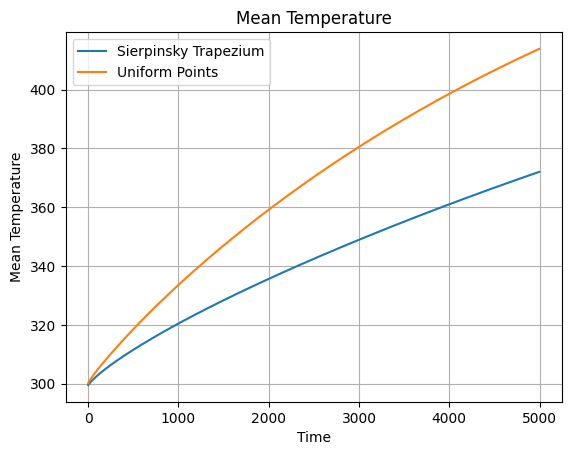

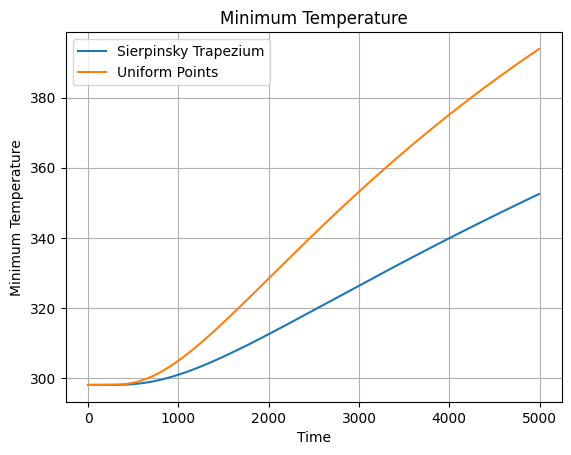

In [24]:
import numpy as np
import matplotlib.pyplot as plt

# Mean temperature plots
mean_trap = np.mean(temps_trap, axis=1)
mean_uni = np.mean(temps_uni, axis=1)
min_trap = np.min(temps_trap, axis=1)
min_uni = np.min(temps_uni, axis=1)
time = np.arange(len(mean_trap)) * dt

# Mean temperature plot
plt.plot(time, mean_trap, label='Sierpinsky Trapezium')
plt.plot(time, mean_uni, label='Uniform Points')
plt.title('Mean Temperature')
plt.xlabel('Time')
plt.ylabel('Mean Temperature')
plt.grid(True)
plt.legend()
plt.savefig("plots/opensec/mean_temp_compare.pdf")
plt.show()

# Minimum temperature plot
plt.plot(time, min_trap, label='Sierpinsky Trapezium')
plt.plot(time, min_uni, label='Uniform Points')
plt.title('Minimum Temperature')
plt.xlabel('Time')
plt.ylabel('Minimum Temperature')
plt.grid(True)
plt.legend()
plt.savefig("plots/opensec/min_temp_compare.pdf")
plt.show()

### With Radiative Cooling

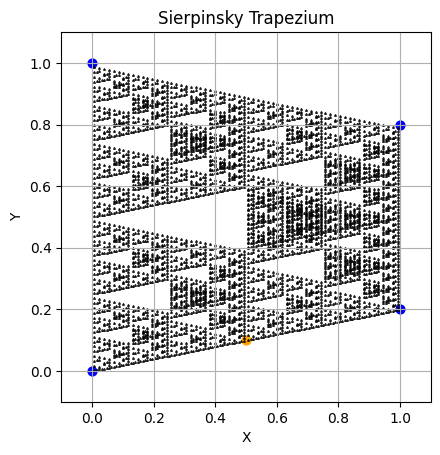

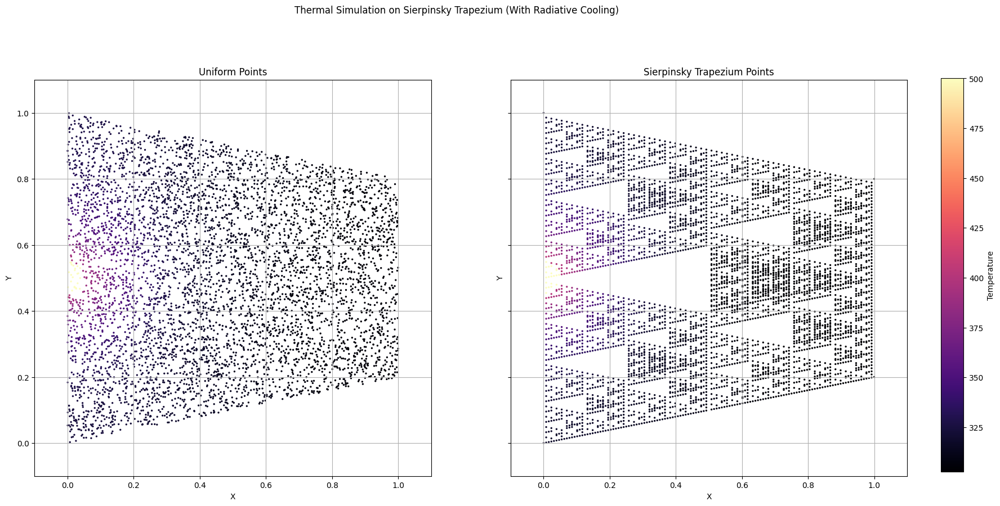

In [3]:
from src.sierpinsky import SierpinskyTriangle, Point
from src.heatequation import ThermalSimulation
from random import uniform
import matplotlib.pyplot as plt

ALPHA = 0.1
K_RAD = 1e-11

trap = SierpinskyTriangle([Point(0,0), Point(1,0.2), Point(0,1), Point(1,0.8)])
for _ in range(6):
    trap.generate_triangle()
fig = trap.plot("Sierpinsky Trapezium")
fig.savefig('plots/opensec.pdf')

sim_trap = ThermalSimulation(trap.points, ALPHA, K_RAD)
sim_trap.place_source(Point(0, 0.5), 500, 0.05)
temps_trap = sim_trap.simulate(5000, 5, save_series=True)



# Place len(trap.points) points uniformly across the trapezium shape

num_points = len(trap.points)
bbox_x = [p.x for p in trap.corners]
bbox_y = [p.y for p in trap.corners]
min_x, max_x = min(bbox_x), max(bbox_x)
min_y, max_y = min(bbox_y), max(bbox_y)

uniform_points = []
while len(uniform_points) < num_points:
    x = uniform(min_x, max_x)
    y = uniform(min_y, max_y)
    pt = Point(x, y)
    if pt.is_inside_polygon(trap.corners):
        uniform_points.append(pt)
sim_uni = ThermalSimulation(uniform_points, ALPHA, K_RAD)
sim_uni.place_source(Point(0, 0.5), 500, 0.05)
temps_uni = sim_uni.simulate(5000, 5, save_series=True)


fig, axs = plt.subplots(1, 2, figsize=(20, 10), sharex=True, sharey=True)

sc1 = axs[0].scatter([p.x for p in uniform_points],
                     [p.y for p in uniform_points], c=sim_uni.temperature, cmap='magma', s=2)
axs[0].set_title('Uniform Points')
axs[0].set_xlabel('X')
axs[0].set_ylabel('Y')
axs[0].grid(True)
axs[0].set_xlim(-0.1, 1.1)
axs[0].set_ylim(-0.1, 1.1)
axs[0].set_aspect('equal')

sc2 = axs[1].scatter([p.x for p in trap.points],
                     [p.y for p in trap.points], c=sim_trap.temperature, cmap='magma', s=2)
axs[1].set_title('Sierpinsky Trapezium Points')
axs[1].set_xlabel('X')
axs[1].set_ylabel('Y')
axs[1].grid(True)
axs[1].set_xlim(-0.1, 1.1)
axs[1].set_ylim(-0.1, 1.1)
axs[1].set_aspect('equal')

# colour bar
vmin = min(sim_uni.temperature.min(), sim_trap.temperature.min())
vmax = max(sim_uni.temperature.max(), sim_trap.temperature.max())
sc1.set_clim(vmin, vmax)
sc2.set_clim(vmin, vmax)
cbar_ax = fig.add_axes([0.93, 0.15, 0.02, 0.7]) 
cbar = fig.colorbar(sc1, cax=cbar_ax)
cbar.set_label('Temperature')

plt.suptitle('Thermal Simulation on Sierpinsky Trapezium (With Radiative Cooling)')
plt.savefig('plots/heat_trapezium_combined_cool.pdf', bbox_inches='tight')
plt.show()


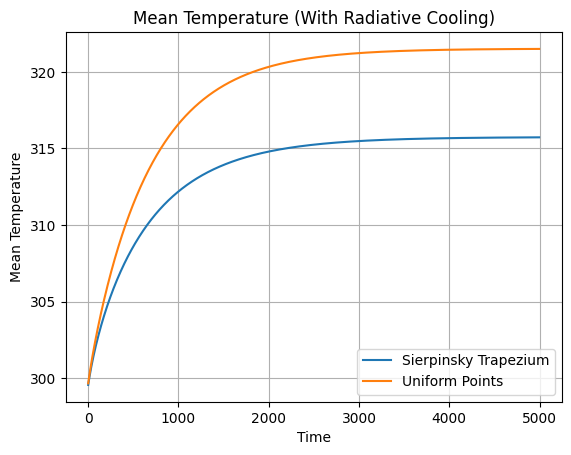

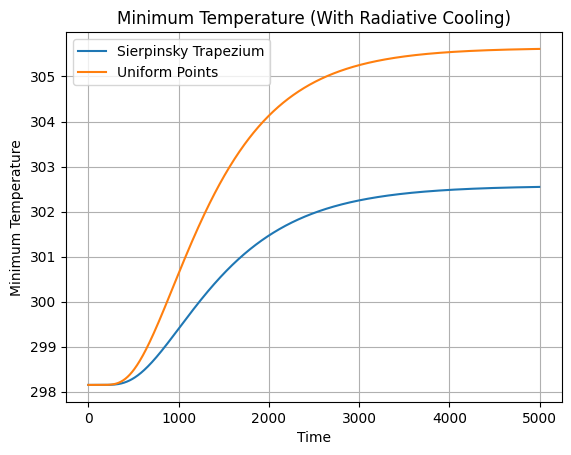

In [4]:
import numpy as np
import matplotlib.pyplot as plt

# Mean temperature plots
mean_trap = np.mean(temps_trap, axis=1)
mean_uni = np.mean(temps_uni, axis=1)
min_trap = np.min(temps_trap, axis=1)
min_uni = np.min(temps_uni, axis=1)
time = np.arange(len(mean_trap)) * dt

# Mean temperature plot
plt.plot(time, mean_trap, label='Sierpinsky Trapezium')
plt.plot(time, mean_uni, label='Uniform Points')
plt.title('Mean Temperature (With Radiative Cooling)')
plt.xlabel('Time')
plt.ylabel('Mean Temperature')
plt.grid(True)
plt.legend()
plt.savefig("plots/opensec/mean_temp_compare_cool.pdf")
plt.show()

# Minimum temperature plot
plt.plot(time, min_trap, label='Sierpinsky Trapezium')
plt.plot(time, min_uni, label='Uniform Points')
plt.title('Minimum Temperature (With Radiative Cooling)')
plt.xlabel('Time')
plt.ylabel('Minimum Temperature')
plt.grid(True)
plt.legend()
plt.savefig("plots/opensec/min_temp_compare_cool.pdf")
plt.show()